In [1]:
%matplotlib inline
import os, sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from utils.helpers import launch_env, wrap_env, view_results_ipython
from simulation.gym_duckietown.wrappers import SteeringToWheelVelWrapper
import numpy as np
import matplotlib.pyplot as plt

INFO:aido-protocols:aido-protocols 5.0.5
08:48:50|zn|__init__.py:6|<module>(): zn 2.0.3
08:48:50|zj|__init__.py:5|<module>(): zj 2.0.4
08:48:51|gym-duckietown|__init__.py:10|<module>(): gym-duckietown 2019.0.0

08:48:51|gym-duckietown|__init__.py:24|reg_map_env(): Registering gym environment id: Duckietown-small_loop-v0
08:48:51|gym-duckietown|__init__.py:24|reg_map_env(): Registering gym environment id: Duckietown-4way-v0
08:48:51|gym-duckietown|__init__.py:24|reg_map_env(): Registering gym environment id: Duckietown-straight_road-v0
08:48:51|gym-duckietown|__init__.py:24|reg_map_env(): Registering gym environment id: Duckietown-loop_obstacles-v0
08:48:51|gym-duckietown|__init__.py:24|reg_map_env(): Registering gym environment id: Duckietown-loop_dyn_duckiebots-v0
08:48:51|gym-duckietown|__init__.py:24|reg_map_env(): Registering gym environment id: Duckietown-loop_pedestrians-v0
08:48:51|gym-duckietown|__init__.py:24|reg_map_env(): Registering gym environment id: Duckietown-zigzag_dis

# Control

In robotics, control is often considered a discipline in its own right. Simply, control theory allows us to map from sensory data (or, some sort of intermediate representation) to actuation commands - these commands can help drive our Duckiebot, fly our planes, and even land our rockets.

For those coming from a machine learning background (or those with familiarity with reinforcement learning and imitation learning), you may have noticed a difference between the control covered in class and the controllers, or *policies*, that you may normally train. In robotics, an important part of control is feedback; Feedback allows our controller to self-regulate and tune, and is an important part of the control process. 

In this exercise, we will cover two controllers: a simple, PD controller, and a slightly more complicated pure-pursuit controller in Part 2. 


## Part 1: PID

A PID controller, named for its components of **Proportional**, **Integral**, and **Derivative**, is a simple yet robust mechanism. This generality has lead to its widespread use across multiple disciplines, and is what our exercise will start with. More eloquently (from Wikipedia): *A PID controller continuously calculates an error value e(t) as the difference between a desired setpoint (SP) and a measured process variable (PV) and applies a correction based on proportional, integral, and derivative terms (denoted P, I, and D respectively), hence the name.*

*In practical terms it automatically applies accurate and responsive correction to a control function.*

In our exercise, we will only implement the **P**ropotional and (an approximation to the) **D**erivative control corrections.

Before we begin with the practical portion, the **first part of the exercise** consists of the following:

*Explain, qualitatively, the difference between the three terms. For the following types of controllers, explain the error terms involved in the correction, and what types of applications they are commonly used for. If these controllers do not exist (or cannot), explain why.*

1. P
2. PI
3. PD
4. ID
5. PID

Put your answers inside of the zip file, inside of a file named **03-control.txt**.

***

As we continue towards the practical portion of the first exercise, we will be tasked with setting up a controller that keeps the Duckiebot on the road. 

In the kinematics exercise, we saw how to translate linear and angular velocity commands into wheel rate. After understanding the conversion, we still need to answer a more important question: *what* commands should we use to control the Duckiebot?

Since we're using a simulation, we are able to access the ground-truth values of two variables that are crucial to help our Duckiebot stay in the lane: $d$, the distance to the center of the lane, and $\omega$, the angle with respect to the lane. 

In your file `notebooks/code/exercise_03_control/controller.py`, complete function `angle_control_commands`. Update `omega` (angular speed) to achieve your goal while keeping `v` constant.

In [2]:
from notebooks.code.exercise_03_control.controller import Controller

# Setting up the environment
local_env = launch_env()
local_env = SteeringToWheelVelWrapper(wrap_env(local_env))
local_env.reset()
local_env.robot_speed = 0.5
total_reward = 0        
controller = Controller()
    
# Starting to drive
error_dist = []
error_angle = []

for _ in range(1000):
    # Getting the pose
    lane_pose = local_env.get_lane_pos2(local_env.cur_pos, local_env.cur_angle)
    dist = lane_pose.dist        # Distance to lane center. Left is negative, right is positive.
    angle = lane_pose.angle_rad  # Angle from straight, in radians. Left is negative, right is positive.
    
    # Control
    v = 0.5  # For now, keep linear velocity constant
    
    omega = controller.angle_control_commands(dist, angle)
    commands = np.array([v, omega])
    
    # Step
    _, r, d, _ = local_env.step(commands)
    total_reward += r
    
    # Store error
    error_dist.append(dist)
    error_angle.append(angle)
    
    if d: 
        print("Duckiebot crashed.")
        break
        
        
local_env.close()

03:22:11|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
03:22:11|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
03:22:11|gym-duckietown|simulator.py:535|_load_map(): loading map file "/duckietown/simulation/gym_duckietown/maps/loop_empty.yaml"
03:22:11|gym-duckietown|objmesh.py:50|__init__(): loading mesh "duckiebot.obj"
03:22:11|gym-duckietown|objmesh.py:238|_load_mtl(): loading materials from "/duckietown/simulation/gym_duckietown/meshes/duckiebot.mtl"
03:22:11|gym-duckietown|objmesh.py:50|__init__(): loading mesh "duckie.obj"
03:22:11|gym-duckietown|graphics.py:60|load_texture(): loading texture "duckie.png"
03:22:11|gym-duckietown|objmesh.py:50|__init__(): loading mesh "cone.obj"
03:22:11|gym-duckietown|graphics.py:60|load_texture(): loading texture "cone.png"
03:22:12|gym-duckietown|graphics.py:60|load_texture(): loading texture "floor_1.png"
03:22:12|gym-duckietown|graphics

03:22:12|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
03:22:12|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
03:22:12|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.59826268 0.         2.08721855]
03:22:12|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.5894849  0.         2.18432262]
03:22:12|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.60704045 0.         1.99011448]
03:22:12|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.48173779 0.         2.07668522]
03:22:12|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.48172154 0.         1.84866924] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f2940f54048>, 'color': array([1, 1, 1])}
03:22:12|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

03:22:12|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [4.02468139 0.         1.75868687]
03:22:12|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.49620504 0.         2.20742184] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f2940f54048>, 'color': array([1, 1, 1])}
03:22:12|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
03:22:12|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
03:22:12|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.57500004 0.         2.14999713]
03:22:12|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.49620504 0.         2.20742184]
03:22:12|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.65379505 0.         2.09257242]
03:22:12|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.50609039 0.         2.05

03:22:16|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
03:22:16|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
03:22:16|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [2.33703727 0.         2.57700384]
03:22:16|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [2.24568806 0.         2.542922  ]
03:22:16|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [2.42838647 0.         2.61108568]
03:22:16|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [2.37793548 0.         2.46738479]
03:22:16|gym-duckietown|simulator.py:1092|_drivable_pos(): [2.28873639 0.         2.68406941] corresponds to tile at (3, 4) which is not drivable: {'coords': (3, 4), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f2940f54048>, 'color': array([1, 1, 1])}
03:22:16|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

03:22:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.38078583 0.         3.23384888] angle 3.2121738363034513
03:22:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.35751058 0.         3.23463242] angle 3.1383146734224967
03:22:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.35751058 0.         3.23463242] angle 3.1383146734224967
03:22:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.33423783 0.         3.23375789] angle 3.069751272669277
03:22:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.33423783 0.         3.23375789] angle 3.069751272669277
03:22:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.3110694  0.         3.23138005] angle 3.008883963936451
03:22:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.3110694  0.         3.23138005] angle 3.008883963936451
03:22:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.28805819 0.         3.22777596] angle 2.9635796488524253
03:22:16|gym-duckietown|simu

03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.73969007 0.         3.12343712] angle 3.0548742925942283
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71647715 0.         3.12149907] angle 3.0617169583161012
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71647715 0.         3.12149907] angle 3.0617169583161012
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.69325191 0.         3.11971449] angle 3.068094323411253
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.69325191 0.         3.11971449] angle 3.068094323411253
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.67001613 0.         3.11807289] angle 3.074025396554071
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.67001613 0.         3.11807289] angle 3.074025396554071
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.64677134 0.         3.11656417] angle 3.0795308806819675
03:22:17|gym-duckietown|simu

03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.08803209 0.         3.10032207] angle 3.055816867691106
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06490379 0.         3.0975845 ] angle 2.991735387326497
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06490379 0.         3.0975845 ] angle 2.991735387326497
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04204026 0.         3.09316293] angle 2.9093870436466784
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04204026 0.         3.09316293] angle 2.9093870436466784
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01967697 0.         3.08667988] angle 2.8094737587966008
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01967697 0.         3.08667988] angle 2.8094737587966008
03:22:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99813607 0.         3.07784807] angle 2.695513085790542
03:22:17|gym-duckietown|simu

03:22:18|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.94274886 0.         2.56520311] angle 1.403576895735187
03:22:18|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.94652462 0.         2.5422175 ] angle 1.4123916143680078
03:22:18|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.94652462 0.         2.5422175 ] angle 1.4123916143680078
03:22:18|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95009594 0.         2.51919924] angle 1.421351842248405
03:22:18|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95009594 0.         2.51919924] angle 1.421351842248405
03:22:18|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95346096 0.         2.49614992] angle 1.4303046359263594
03:22:18|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95346096 0.         2.49614992] angle 1.4303046359263594
03:22:18|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95662095 0.         2.4730716 ] angle 1.4391315875090196
03:22:18|gym-duckietown|sim

03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99001055 0.         1.91532073] angle 1.5528336827801477
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99041066 0.         1.89203043] angle 1.5544034503622552
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99041066 0.         1.89203043] angle 1.5544034503622552
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99077576 0.         1.86873956] angle 1.5558405644533255
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99077576 0.         1.86873956] angle 1.5558405644533255
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99110881 0.         1.84544821] angle 1.55715553366209
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99110881 0.         1.84544821] angle 1.55715553366209
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99141254 0.         1.82215646] angle 1.5583581462566918
03:22:19|gym-duckietown|simu

03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99418385 0.         1.2631164 ] angle 1.5695001151998407
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99421267 0.         1.23982269] angle 1.5696179440836329
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99421267 0.         1.23982269] angle 1.5696179440836329
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99423887 0.         1.21652897] angle 1.5697251100917389
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99423887 0.         1.21652897] angle 1.5697251100917389
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99426269 0.         1.19323525] angle 1.569822570984751
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99426269 0.         1.19323525] angle 1.569822570984751
03:22:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99428434 0.         1.16994152] angle 1.5699111995702495
03:22:19|gym-duckietown|si

03:22:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.35949453 0.         0.91027733] angle -0.19728131842206406
03:22:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.38232934 0.         0.91487831] angle -0.2003736445035381
03:22:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.38232934 0.         0.91487831] angle -0.2003736445035381
03:22:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.40515774 0.         0.91951108] angle -0.2000663036502104
03:22:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.40515774 0.         0.91951108] angle -0.2000663036502104
03:22:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.4279936  0.         0.92410685] angle -0.19713268982374368
03:22:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.4279936  0.         0.92410685] angle -0.19713268982374368
03:22:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.45084733 0.         0.92861284] angle -0.19220610711034364
03:22:20|gym

03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.006336   0.         0.98560273] angle -0.03491032695668962
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02961671 0.         0.98638141] angle -0.03195967396038241
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02961671 0.         0.98638141] angle -0.03195967396038241
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.05289953 0.         0.98709412] angle -0.029242878741021217
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.05289953 0.         0.98709412] angle -0.029242878741021217
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.07618413 0.         0.9877461 ] angle -0.026743886667738637
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.07618413 0.         0.9877461 ] angle -0.026743886667738637
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.09947023 0.         0.98834225] angle -0.02444732398483267
03:2

03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.65848223 0.         0.99385914] angle -0.0026200145992136114
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.65848223 0.         0.99385914] angle -0.0026200145992136114
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.6817759  0.         0.99391741] angle -0.002382914722747482
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.6817759  0.         0.99391741] angle -0.002382914722747482
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.70506957 0.         0.9939704 ] angle -0.0021671120505078086
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.70506957 0.         0.9939704 ] angle -0.0021671120505078086
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.72836325 0.         0.9940186 ] angle -0.0019707174600677277
03:22:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.72836325 0.         0.9940186 ] angle -0.00197071746006

03:22:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.28741263 0.         0.9944516 ] angle -0.00019908805616892624
03:22:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.31070637 0.         0.99445603] angle -0.0001808979134049426
03:22:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.31070637 0.         0.99445603] angle -0.0001808979134049426
03:22:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.3340001  0.         0.99446005] angle -0.00016436768857162643
03:22:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.3340001  0.         0.99446005] angle -0.00016436768857162643
03:22:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.35729383 0.         0.9944637 ] angle -0.00014934621476264312
03:22:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.35729383 0.         0.9944637 ] angle -0.00014934621476264312
03:22:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.38058757 0.         0.99446702] angle -0.0001356

03:22:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78928396 0.         1.23172244] angle -1.633234138916238
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78928396 0.         1.23172244] angle -1.633234138916238
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78729762 0.         1.25492927] angle -1.679127941355611
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78729762 0.         1.25492927] angle -1.679127941355611
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78438542 0.         1.27803911] angle -1.7131746324549453
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78438542 0.         1.27803911] angle -1.7131746324549453
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.7807989 0.        1.3010545] angle -1.73759467581179
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.7807989 0.        1.3010545] angle -1.73759467581179
03:22:23|gym-duckietown|simula

03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70023435 0.         1.87711629] angle -1.6272542540728063
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70023435 0.         1.87711629] angle -1.6272542540728063
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69897309 0.         1.90037584] angle -1.6226835465403862
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69897309 0.         1.90037584] angle -1.6226835465403862
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69781431 0.         1.92364071] angle -1.6184430391617661
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69781431 0.         1.92364071] angle -1.6184430391617661
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69675055 0.         1.94691013] angle -1.6145154969731252
03:22:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69675055 0.         1.94691013] angle -1.6145154969731252
03:22:23|gym-duc

03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.65619613 0.         2.52415467] angle -2.0906636055864354
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.65619613 0.         2.52415467] angle -2.0906636055864354
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.64338414 0.         2.54359007] angle -2.216571982513662
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.64338414 0.         2.54359007] angle -2.216571982513662
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62819885 0.         2.56123215] angle -2.3464167657792294
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62819885 0.         2.56123215] angle -2.3464167657792294
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61087294 0.         2.57677799] angle -2.474170287186281
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61087294 0.         2.57677799] angle -2.474170287186281
03:22:24|gym-duckiet

03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.04398793 0.         2.5514792 ] angle -3.2677289677301258
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.04398793 0.         2.5514792 ] angle -3.2677289677301258
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.02086717 0.         2.54864623] angle -3.259299356630355
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.02086717 0.         2.54864623] angle -3.259299356630355
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.99772377 0.         2.54600463] angle -3.2511835566537113
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.99772377 0.         2.54600463] angle -3.2511835566537113
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.97456012 0.         2.54354686] angle -3.2434199098115717
03:22:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.97456012 0.         2.54354686] angle -3.2434199098115717
03:22:24|gym-ducki

03:22:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.46521037 0.         2.74262585] angle -2.074834287756753
03:22:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.46521037 0.         2.74262585] angle -2.074834287756753
03:22:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.45471253 0.         2.76341416] angle -2.002018225287504
03:22:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.45471253 0.         2.76341416] angle -2.002018225287504
03:22:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44575161 0.         2.78490979] angle -1.9295061372385842
03:22:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44575161 0.         2.78490979] angle -1.9295061372385842
03:22:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43837108 0.         2.80699799] angle -1.857037523137034
03:22:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43837108 0.         2.80699799] angle -1.857037523137034
03:22:25|gym-duckietow

03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.15054268 0.         3.16567101] angle -3.2492093200737404
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.15054268 0.         3.16567101] angle -3.2492093200737404
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.12740046 0.         3.16301993] angle -3.2620932847643687
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.12740046 0.         3.16301993] angle -3.2620932847643687
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.10428758 0.         3.16012343] angle -3.2704322561829837
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.10428758 0.         3.16012343] angle -3.2704322561829837
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.08119404 0.         3.15707618] angle -3.275142008036895
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.08119404 0.         3.15707618] angle -3.275142008036895
03:22:26|gym-ducki

03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.50125948 0.         3.10828515] angle -3.1718259940972846
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.50125948 0.         3.10828515] angle -3.1718259940972846
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.47797553 0.         3.10761021] angle -3.169317148756077
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.47797553 0.         3.10761021] angle -3.169317148756077
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.45469003 0.         3.10699147] angle -3.166999664691972
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.45469003 0.         3.10699147] angle -3.166999664691972
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.43140319 0.         3.1064246 ] angle -3.1648616885255927
03:22:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.43140319 0.         3.1064246 ] angle -3.1648616885255927
03:22:26|gym-duckiet

03:22:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.90349525 0.         2.97172598] angle -4.3658176493090535
03:22:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.90349525 0.         2.97172598] angle -4.3658176493090535
03:22:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.89677336 0.         2.94943488] angle -4.473203052546043
03:22:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.89677336 0.         2.94943488] angle -4.473203052546043
03:22:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.8923838  0.         2.92656818] angle -4.5722633112019935
03:22:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.8923838  0.         2.92656818] angle -4.5722633112019935
03:22:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.89019123 0.         2.90338605] angle -4.663915941083594
03:22:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.89019123 0.         2.90338605] angle -4.663915941083594
03:22:27|gym-duckiet

03:22:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99263164 0.         1.69919384] angle -4.719965533361871
03:22:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99280024 0.         1.67590072] angle -4.719288696519292
03:22:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99280024 0.         1.67590072] angle -4.719288696519292
03:22:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99295377 0.         1.65260749] angle -4.71867133616842
03:22:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99295377 0.         1.65260749] angle -4.71867133616842
03:22:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99309356 0.         1.62931418] angle -4.718108375663841
03:22:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99309356 0.         1.62931418] angle -4.718108375663841
03:22:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9932208  0.         1.60602079] angle -4.717595148588276
03:22:28|gym-duckietown|si

03:22:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00215981 0.         1.04747536] angle -4.923418318112164
03:22:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00812364 0.         1.02496726] angle -5.019383117229495
03:22:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00812364 0.         1.02496726] angle -5.019383117229495
03:22:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01639493 0.         1.00320462] angle -5.131808048829978
03:22:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01639493 0.         1.00320462] angle -5.131808048829978
03:22:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0271593 0.        0.9825637] angle -5.254378251354884
03:22:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0271593 0.        0.9825637] angle -5.254378251354884
03:22:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04042022 0.         0.96343251] angle -5.382636774917576
03:22:29|gym-duckietown|simula

03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.57227994 0.         0.94962859] angle -6.4336367867266455
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.5953258  0.         0.95301726] angle -6.424721585247557
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.5953258  0.         0.95301726] angle -6.424721585247557
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.61840078 0.         0.95620152] angle -6.415909701414164
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.61840078 0.         0.95620152] angle -6.415909701414164
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.64150264 0.         0.95918462] angle -6.407296098566904
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.64150264 0.         0.95918462] angle -6.407296098566904
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.66462896 0.         0.96197174] angle -6.3989517363641655
03:22:30|gym-duckietow

03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.22270624 0.         0.99072461] angle -6.298341183904446
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.24599753 0.         0.99106212] angle -6.297009386944303
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.24599753 0.         0.99106212] angle -6.297009386944303
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.26928922 0.         0.99136994] angle -6.295791266271898
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.26928922 0.         0.99136994] angle -6.295791266271898
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.29258127 0.         0.99165061] angle -6.294677635525179
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.29258127 0.         0.99165061] angle -6.294677635525179
03:22:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.31587359 0.         0.99190645] angle -6.293659968880459
03:22:30|gym-duckietown|

03:22:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.87491645 0.         0.99423518] angle -6.284271627422723
03:22:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.89821017 0.         0.99425933] angle -6.284172800574892
03:22:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.89821017 0.         0.99425933] angle -6.284172800574892
03:22:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.9215039  0.         0.99428129] angle -6.284082928602381
03:22:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.9215039  0.         0.99428129] angle -6.284082928602381
03:22:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.94479762 0.         0.99430124] angle -6.28400120542486
03:22:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.94479762 0.         0.99430124] angle -6.28400120542486
03:22:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.96809135 0.         0.99431938] angle -6.283926896723126
03:22:31|gym-duckietown|si

03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.52714093 0.         0.9944819 ] angle -6.283259790687954
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.55043408 0.         0.99462569] angle -6.295456152415665
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.55043408 0.         0.99462569] angle -6.295456152415665
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.57371742 0.         0.99528675] angle -6.327683220626037
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.57371742 0.         0.99528675] angle -6.327683220626037
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.59695308 0.         0.99689676] angle -6.377047037471205
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.59695308 0.         0.99689676] angle -6.377047037471205
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.6200499  0.         0.99988286] angle -6.446470211898925
03:22:32|gym-duckietown|

03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74800042 0.         1.46802914] angle -8.041206539849428
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74374729 0.         1.49093125] angle -8.033991571344334
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74374729 0.         1.49093125] angle -8.033991571344334
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.73966863 0.         1.51386506] angle -8.025980455017493
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.73966863 0.         1.51386506] angle -8.025980455017493
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.73577968 0.         1.53683179] angle -8.01746024973012
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.73577968 0.         1.53683179] angle -8.01746024973012
03:22:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.73208977 0.         1.55983134] angle -8.008660012800416
03:22:32|gym-duckietown|si

03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69123655 0.         2.11697067] angle -7.876798703079845
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.6907281  0.         2.14025885] angle -7.874824400317687
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.6907281  0.         2.14025885] angle -7.874824400317687
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69026371 0.         2.16354795] angle -7.873013888189888
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69026371 0.         2.16354795] angle -7.873013888189888
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68983972 0.         2.18683782] angle -7.871354678543601
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68983972 0.         2.18683782] angle -7.871354678543601
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68945276 0.         2.21012834] angle -7.869835056393734
03:22:33|gym-duckietown|

03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.45047014 0.         2.62018331] angle -9.484609623860758
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.4272594  0.         2.61824434] angle -9.531634223245453
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.4272594  0.         2.61824434] angle -9.531634223245453
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.40414663 0.         2.6153559 ] angle -9.566575893202142
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.40414663 0.         2.6153559 ] angle -9.566575893202142
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.38113046 0.         2.61177468] angle -9.591696279476325
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.38113046 0.         2.61177468] angle -9.591696279476325
03:22:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.35819485 0.         2.6077074 ] angle -9.608879689179597
03:22:33|gym-duckietown|

03:22:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.80508369 0.         2.53719582] angle -9.328284980430123
03:22:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.78196364 0.         2.54001527] angle -9.278573169439673
03:22:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.78196364 0.         2.54001527] angle -9.278573169439673
03:22:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.75899374 0.         2.54387625] angle -9.237918641421475
03:22:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.75899374 0.         2.54387625] angle -9.237918641421475
03:22:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.73622567 0.         2.54878498] angle -9.186943304298968
03:22:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.73622567 0.         2.54878498] angle -9.186943304298968
03:22:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.71373592 0.         2.55484251] angle -9.136408141552959
03:22:34|gym-duckietown|

03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43197451 0.         2.9747899 ] angle -7.738877431246379
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43398408 0.         2.99799357] angle -7.79630596148709
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43398408 0.         2.99799357] angle -7.79630596148709
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43414391 0.         3.02127674] angle -7.897927967620135
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43414391 0.         3.02127674] angle -7.897927967620135
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43141366 0.         3.04438872] angle -8.045208257012348
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43141366 0.         3.04438872] angle -8.045208257012348
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.42507833 0.         3.06677554] angle -8.214319943857305
03:22:35|gym-duckietown|si

03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.90845006 0.         3.13441496] angle -9.534263937418588
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.88528861 0.         3.13193633] angle -9.528510714414617
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.88528861 0.         3.13193633] angle -9.528510714414617
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.86211315 0.         3.1295922 ] angle -9.522654220869695
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.86211315 0.         3.1295922 ] angle -9.522654220869695
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.83892437 0.         3.12738384] angle -9.516796831753512
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.83892437 0.         3.12738384] angle -9.516796831753512
03:22:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.81572313 0.         3.12531043] angle -9.511017824328786
03:22:35|gym-duckietown|

03:22:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.25723063 0.         3.10343554] angle -9.436526327553146
03:22:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.23393837 0.         3.10317385] angle -9.43549918789715
03:22:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.23393837 0.         3.10317385] angle -9.43549918789715
03:22:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.21064586 0.         3.10293507] angle -9.434558911161917
03:22:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.21064586 0.         3.10293507] angle -9.434558911161917
03:22:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.18735315 0.         3.10271725] angle -9.43369860691117
03:22:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.18735315 0.         3.10271725] angle -9.43369860691117
03:22:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.16406026 0.         3.10251862] angle -9.432911858375428
03:22:36|gym-duckietown|simu

03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91103926 0.         2.73035762] angle -11.194344423052375
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91566521 0.         2.70752785] angle -11.196646242128223
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91566521 0.         2.70752785] angle -11.196646242128223
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.92030684 0.         2.68470126] angle -11.1957179921138
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.92030684 0.         2.68470126] angle -11.1957179921138
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.92489888 0.         2.66186465] angle -11.19230294620796
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.92489888 0.         2.66186465] angle -11.19230294620796
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.92939143 0.         2.63900828] angle -11.18700924711495
03:22:37|gym-duckietown

03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98575178 0.         2.08344964] angle -11.029924274974071
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98651792 0.         2.06016851] angle -11.0270173476809
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98651792 0.         2.06016851] angle -11.0270173476809
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98721908 0.         2.03688534] angle -11.024341393201293
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98721908 0.         2.03688534] angle -11.024341393201293
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98786043 0.         2.01360044] angle -11.021880456268425
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98786043 0.         2.01360044] angle -11.021880456268425
03:22:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9884468 0.        1.9903141] angle -11.019619277600995
03:22:37|gym-duckietown

03:22:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99387039 0.         1.43130084] angle -10.998148587685447
03:22:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99392764 0.         1.40800718] angle -10.997915587526085
03:22:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99392764 0.         1.40800718] angle -10.997915587526085
03:22:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99397971 0.         1.3847135 ] angle -10.997703521900364
03:22:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99397971 0.         1.3847135 ] angle -10.997703521900364
03:22:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99402706 0.         1.36141982] angle -10.997510533013157
03:22:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99402706 0.         1.36141982] angle -10.997510533013157
03:22:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99407011 0.         1.33812612] angle -10.9973349244458
03:22:38|gym-ducki

03:22:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.19294245 0.         0.89040674] angle -12.520224892353038
03:22:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.21622996 0.         0.89016309] angle -12.591591971880765
03:22:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.21622996 0.         0.89016309] angle -12.591591971880765


You can see how well you are doing:

In [3]:
print("Your score: {}".format(total_reward))
view_results_ipython(local_env)

Your score: 326.46739266135876


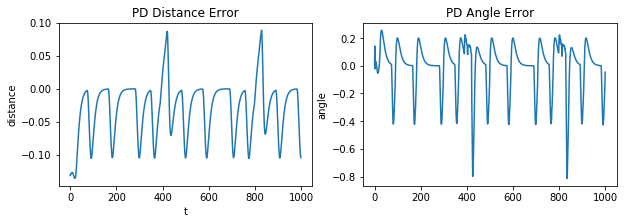

In [4]:
# Plot error

'''Plot distribution'''
plt.figure(figsize = (10,3))

plt.subplot(121)
plt.plot(error_dist)
plt.xlabel('t')
plt.ylabel('distance')
plt.title('PD Distance Error')

plt.subplot(122)
plt.plot(error_angle)
plt.ylabel('angle')
plt.title('PD Angle Error')

plt.show()

Within **03-control.txt**, answer the following question:

*Describe the method you used. What kind of controller is it?*

Then, from the list of popular variants of PID controllers, implement a second one. Answer the above question again, and then discuss the differences (both in terms of algorithm and performance) between the two. Do you see any qualitative differences in the driving? Why or why not? Put your answers in **03-control.txt**.

Lastly, for both implementation, plot the **cross-track** error and the **angle error**, and submit the plot(s) (depending on if you decide to separate the metrics on two plots) in the zip file. 

In [2]:
'''Now, lets implement PID controller'''

from notebooks.code.exercise_03_control.controller import Controller

# Setting up the environment
local_env = launch_env()
local_env = SteeringToWheelVelWrapper(wrap_env(local_env))
local_env.reset()
local_env.robot_speed = 0.5
total_reward = 0        
controller = Controller()
    
# Starting to drive
error_dist = []
error_angle = []
error_dist_saturated = []

for _ in range(1000):
    # Getting the pose
    lane_pose = local_env.get_lane_pos2(local_env.cur_pos, local_env.cur_angle)
    dist = lane_pose.dist        # Distance to lane center. Left is negative, right is positive.
    angle = lane_pose.angle_rad  # Angle from straight, in radians. Left is negative, right is positive.
    
    # Store error
    error_dist.append(dist)
    error_angle.append(angle)
    
    # Control
    v = 0.5  # For now, keep linear velocity constant
    
    omega = controller.pid_angle_control_commands(dist, angle)
    commands = np.array([v, omega])
    
    # Step
    _, r, d, _ = local_env.step(commands)
    total_reward += r
    
    
    
    if d: 
        print("Duckiebot crashed.")
        break
        
        
local_env.close()

03:25:14|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
03:25:14|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
03:25:14|gym-duckietown|simulator.py:535|_load_map(): loading map file "/duckietown/simulation/gym_duckietown/maps/loop_empty.yaml"
03:25:14|gym-duckietown|objmesh.py:50|__init__(): loading mesh "duckiebot.obj"
03:25:14|gym-duckietown|objmesh.py:238|_load_mtl(): loading materials from "/duckietown/simulation/gym_duckietown/meshes/duckiebot.mtl"
03:25:14|gym-duckietown|objmesh.py:50|__init__(): loading mesh "duckie.obj"
03:25:14|gym-duckietown|graphics.py:60|load_texture(): loading texture "duckie.png"
03:25:14|gym-duckietown|objmesh.py:50|__init__(): loading mesh "cone.obj"
03:25:14|gym-duckietown|graphics.py:60|load_texture(): loading texture "cone.png"
03:25:14|gym-duckietown|graphics.py:60|load_texture(): loading texture "floor_1.png"
03:25:15|gym-duckietown|graphics

03:25:15|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
03:25:15|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
03:25:15|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.59826268 0.         2.08721855]
03:25:15|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.5894849  0.         2.18432262]
03:25:15|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.60704045 0.         1.99011448]
03:25:15|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.48173779 0.         2.07668522]
03:25:15|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.48172154 0.         1.84866924] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7febf4ca3160>, 'color': array([1, 1, 1])}
03:25:15|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

03:25:15|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [4.02468139 0.         1.75868687]
03:25:15|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.49620504 0.         2.20742184] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7febf4ca3160>, 'color': array([1, 1, 1])}
03:25:15|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
03:25:15|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
03:25:15|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.57500004 0.         2.14999713]
03:25:15|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.49620504 0.         2.20742184]
03:25:15|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.65379505 0.         2.09257242]
03:25:15|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.50609039 0.         2.05

03:25:18|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
03:25:18|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
03:25:18|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [2.33703727 0.         2.57700384]
03:25:18|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [2.24568806 0.         2.542922  ]
03:25:18|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [2.42838647 0.         2.61108568]
03:25:18|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [2.37793548 0.         2.46738479]
03:25:18|gym-duckietown|simulator.py:1092|_drivable_pos(): [2.28873639 0.         2.68406941] corresponds to tile at (3, 4) which is not drivable: {'coords': (3, 4), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7febf4ca3160>, 'color': array([1, 1, 1])}
03:25:18|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

03:25:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.38080991 0.         3.2338571 ] angle 3.2120551573405303
03:25:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.35753456 0.         3.23463781] angle 3.1381896077556033
03:25:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.35753456 0.         3.23463781] angle 3.1381896077556033
03:25:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.33426193 0.         3.23376043] angle 3.0696316477687544
03:25:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.33426193 0.         3.23376043] angle 3.0696316477687544
03:25:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.31109375 0.         3.23138004] angle 3.0087840091414817
03:25:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.31109375 0.         3.23138004] angle 3.0087840091414817
03:25:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.28808282 0.         3.22777413] angle 2.9635211340762173
03:25:19|gym-duckietown|

03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.73959131 0.         3.12419565] angle 3.057118140085078
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71637412 0.         3.12230943] angle 3.0639385208255625
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71637412 0.         3.12230943] angle 3.0639385208255625
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.69314501 0.         3.12057609] angle 3.070284066813372
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.69314501 0.         3.12057609] angle 3.070284066813372
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.66990571 0.         3.11898492] angle 3.0761773635480023
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.66990571 0.         3.11898492] angle 3.0761773635480023
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.64665776 0.         3.11752572] angle 3.0816380047843253
03:25:20|gym-duckietown|sim

03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.08789624 0.         3.10199958] angle 3.0558508424847797
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06476561 0.         3.09928026] angle 2.993281140917713
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06476561 0.         3.09928026] angle 2.993281140917713
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04189607 0.         3.09489012] angle 2.9105900188765026
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04189607 0.         3.09489012] angle 2.9105900188765026
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01952004 0.         3.08845016] angle 2.8121295832756674
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01952004 0.         3.08845016] angle 2.8121295832756674
03:25:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99795049 0.         3.07968788] angle 2.6993187854805853
03:25:20|gym-duckietown|si

03:25:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.94145484 0.         2.56781787] angle 1.402362305695924
03:25:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.94525616 0.         2.54483648] angle 1.4113819164623829
03:25:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.94525616 0.         2.54483648] angle 1.4113819164623829
03:25:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.94884834 0.         2.52182148] angle 1.4205491140380289
03:25:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.94884834 0.         2.52182148] angle 1.4205491140380289
03:25:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95222952 0.         2.49877453] angle 1.4297048584177903
03:25:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95222952 0.         2.49877453] angle 1.4297048584177903
03:25:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95540111 0.         2.4756978 ] angle 1.438725663708102
03:25:21|gym-duckietown|si

03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98841495 0.         1.91793106] angle 1.5536788791403948
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98879569 0.         1.89464044] angle 1.5552215256174153
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98879569 0.         1.89464044] angle 1.5552215256174153
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98914207 0.         1.87134929] angle 1.5566302450202285
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98914207 0.         1.87134929] angle 1.5566302450202285
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98945706 0.         1.84805769] angle 1.5579160556390435
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98945706 0.         1.84805769] angle 1.5579160556390435
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98974343 0.         1.82476571] angle 1.559088448760302
03:25:22|gym-duckietown|s

03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99228553 0.         1.2657243 ] angle 1.5696729175026694
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99231046 0.         1.24243057] angle 1.5697787225226052
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99231046 0.         1.24243057] angle 1.5697787225226052
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99233305 0.         1.21913685] angle 1.5698746236376186
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99233305 0.         1.21913685] angle 1.5698746236376186
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99235351 0.         1.19584313] angle 1.5699615587948552
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99235351 0.         1.19584313] angle 1.5699615587948552
03:25:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99237203 0.         1.1725494 ] angle 1.5700403499321514
03:25:22|gym-duckietown|

03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.3540093  0.         0.90833654] angle -0.198000215065392
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.37683947 0.         0.91296046] angle -0.20166445270020353
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.37683947 0.         0.91296046] angle -0.20166445270020353
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.39966097 0.         0.91762706] angle -0.201739476214516
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.39966097 0.         0.91762706] angle -0.201739476214516
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.42248858 0.         0.92226367] angle -0.1990368083682926
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.42248858 0.         0.92226367] angle -0.1990368083682926
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.44533343 0.         0.92681447] angle -0.19422454910946904
03:25:23|gym-duc

03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.00076761 0.         0.98408545] angle -0.034232719736500564
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02404885 0.         0.98484815] angle -0.03126389245414963
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02404885 0.         0.98484815] angle -0.03126389245414963
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.04733217 0.         0.98554451] angle -0.028534880997467902
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.04733217 0.         0.98554451] angle -0.028534880997467902
03:25:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.07061723 0.         0.98617995] angle -0.0260306080422662
03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.07061723 0.         0.98617995] angle -0.0260306080422662
03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.09390374 0.         0.9867595 ] angle -0.0237345153882421
03:25:24

03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.6529189  0.         0.99199714] angle -0.0023636212100524336
03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.6529189  0.         0.99199714] angle -0.0023636212100524336
03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.67621257 0.         0.99204962] angle -0.0021423558009490656
03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.67621257 0.         0.99204962] angle -0.0021423558009490656
03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.69950626 0.         0.99209719] angle -0.0019415772743540402
03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.69950626 0.         0.99209719] angle -0.0019415772743540402
03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.72279995 0.         0.99214029] angle -0.001759499835722257
03:25:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.72279995 0.         0.99214029] angle -0.0017594998357

03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.28184938 0.         0.99251656] angle -0.00016312212061534776
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.30514312 0.         0.99252018] angle -0.00014767773865694215
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.30514312 0.         0.99252018] angle -0.00014767773865694215
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.32843685 0.         0.99252345] angle -0.0001336952761905717
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.32843685 0.         0.99252345] angle -0.0001336952761905717
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.35173059 0.         0.99252642] angle -0.00012103637246643641
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.35173059 0.         0.99252642] angle -0.00012103637246643641
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.37502432 0.         0.9925291 ] angle -0.0001095

03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.79076932 0.         1.22379287] angle -1.6178881618643248
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.79076932 0.         1.22379287] angle -1.6178881618643248
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78908991 0.         1.24702354] angle -1.6680395309301734
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78908991 0.         1.24702354] angle -1.6680395309301734
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78639454 0.         1.27015943] angle -1.705510339438302
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78639454 0.         1.27015943] angle -1.705510339438302
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78295314 0.         1.29319683] angle -1.7326558776417251
03:25:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.78295314 0.         1.29319683] angle -1.7326558776417251
03:25:25|gym-ducki

03:25:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70180332 0.         1.86917223] angle -1.6272670395310627
03:25:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70180332 0.         1.86917223] angle -1.6272670395310627
03:25:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70054292 0.         1.89243182] angle -1.6225967995861241
03:25:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70054292 0.         1.89243182] angle -1.6225967995861241
03:25:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69938718 0.         1.91569684] angle -1.6182688120234
03:25:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69938718 0.         1.91569684] angle -1.6182688120234
03:25:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69832834 0.         1.93896648] angle -1.6142671499354728
03:25:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69832834 0.         1.93896648] angle -1.6142671499354728
03:25:26|gym-duckietow

03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.66198365 0.         2.51727026] angle -2.043729308111677
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.66198365 0.         2.51727026] angle -2.043729308111677
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.65011326 0.         2.53729507] angle -2.168057634826737
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.65011326 0.         2.53729507] angle -2.168057634826737
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.63582293 0.         2.55567034] angle -2.2955161159617203
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.63582293 0.         2.55567034] angle -2.2955161159617203
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.6193052  0.         2.57207209] angle -2.4239188476086664
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.6193052  0.         2.57207209] angle -2.4239188476086664
03:25:27|gym-duckiet

03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.05453202 0.         2.55358319] angle -3.2704910570815287
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.05453202 0.         2.55358319] angle -3.2704910570815287
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.03141883 0.         2.55068922] angle -3.2618142906183505
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.03141883 0.         2.55068922] angle -3.2618142906183505
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.00828181 0.         2.54799233] angle -3.253447592553346
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.00828181 0.         2.54799233] angle -3.253447592553346
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.98512348 0.         2.54548498] angle -3.2454375297664173
03:25:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.98512348 0.         2.54548498] angle -3.2454375297664173
03:25:27|gym-ducki

03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47166799 0.         2.73649615] angle -2.1069355450647
03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47166799 0.         2.73649615] angle -2.1069355450647
03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.46050626 0.         2.75693571] angle -2.034321817783776
03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.46050626 0.         2.75693571] angle -2.034321817783776
03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.45088011 0.         2.77814142] angle -1.959524248281974
03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.45088011 0.         2.77814142] angle -1.959524248281974
03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44285993 0.         2.80000521] angle -1.8852371221180837
03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44285993 0.         2.80000521] angle -1.8852371221180837
03:25:28|gym-duckietown|si

03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.16089202 0.         3.16848209] angle -3.2444349890952653
03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.16089202 0.         3.16848209] angle -3.2444349890952653
03:25:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.13774027 0.         3.16591606] angle -3.259519589002205
03:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.13774027 0.         3.16591606] angle -3.259519589002205
03:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.11462248 0.         3.16305926] angle -3.269570383359306
03:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.11462248 0.         3.16305926] angle -3.269570383359306
03:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.09152832 0.         3.16001686] angle -3.275584887326543
03:25:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.09152832 0.         3.16001686] angle -3.275584887326543
03:25:29|gym-duckietow

03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91718512 0.         3.00448289] angle -4.186884796271112
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9067204 0.        2.9836874] angle -4.305451517452362
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9067204 0.        2.9836874] angle -4.305451517452362
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.89871874 0.         2.96182413] angle -4.41763670098736
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.89871874 0.         2.96182413] angle -4.41763670098736
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.89312046 0.         2.93922392] angle -4.521497798043601
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.89312046 0.         2.93922392] angle -4.521497798043601
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.88979828 0.         2.91617724] angle -4.616952811704153
03:25:30|gym-duckietown|simulato

03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96808183 0.         2.36368846] angle -4.804585592881824
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97014514 0.         2.34048633] angle -4.7975808757013985
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97014514 0.         2.34048633] angle -4.7975808757013985
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97205066 0.         2.31727071] angle -4.790988349353974
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97205066 0.         2.31727071] angle -4.790988349353974
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97380784 0.         2.29404338] angle -4.784805184306727
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97380784 0.         2.29404338] angle -4.784805184306727
03:25:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97542604 0.         2.27080596] angle -4.779023719162236
03:25:31|gym-duckietow

03:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9908106  0.         1.71204628] angle -4.71971027847481
03:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99097328 0.         1.68875312] angle -4.719035208842213
03:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99097328 0.         1.68875312] angle -4.719035208842213
03:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99112094 0.         1.66545985] angle -4.718421245167344
03:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99112094 0.         1.66545985] angle -4.718421245167344
03:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99125496 0.         1.6421665 ] angle -4.717863033338766
03:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99125496 0.         1.6421665 ] angle -4.717863033338766
03:25:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99137656 0.         1.61887309] angle -4.717355695922816
03:25:31|gym-duckietown|s

03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99778184 0.         1.0600865 ] angle -4.873623163710704
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00250975 0.         1.03728503] angle -4.96006271991268
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.00250975 0.         1.03728503] angle -4.96006271991268
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0093807  0.         1.01503865] angle -5.063840061087632
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0093807  0.         1.01503865] angle -5.063840061087632
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01864373 0.         0.99368001] angle -5.179353787123915
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01864373 0.         0.99368001] angle -5.179353787123915
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.03040141 0.         0.97358901] angle -5.30438791244701
03:25:32|gym-duckietown|sim

03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.55652777 0.         0.94653647] angle -6.438974325488486
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.57955554 0.         0.95004589] angle -6.429868243509044
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.57955554 0.         0.95004589] angle -6.429868243509044
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.60261424 0.         0.953346  ] angle -6.420807306626761
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.60261424 0.         0.953346  ] angle -6.420807306626761
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.62570166 0.         0.95643881] angle -6.411899387621455
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.62570166 0.         0.95643881] angle -6.411899387621455
03:25:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.64881536 0.         0.9593287 ] angle -6.403238918494744
03:25:32|gym-duckietown|

03:25:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.20683037 0.         0.98886718] angle -6.2982609373221425
03:25:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.23012169 0.         0.98920246] angle -6.296897878184188
03:25:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.23012169 0.         0.98920246] angle -6.296897878184188
03:25:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.25341342 0.         0.98950739] angle -6.29565432590745
03:25:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.25341342 0.         0.98950739] angle -6.29565432590745
03:25:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.27670551 0.         0.98978463] angle -6.294520456478107
03:25:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.27670551 0.         0.98978463] angle -6.294520456478107
03:25:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.29999788 0.         0.99003662] angle -6.293486898192698
03:25:33|gym-duckietown|s

03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.85904115 0.         0.99227192] angle -6.284171848970692
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.88233487 0.         0.99229381] angle -6.284078797668237
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.88233487 0.         0.99229381] angle -6.284078797668237
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.9056286  0.         0.99231364] angle -6.283994473941071
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.9056286  0.         0.99231364] angle -6.283994473941071
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.92892233 0.         0.9923316 ] angle -6.283918035251719
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.92892233 0.         0.9923316 ] angle -6.283918035251719
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.95221605 0.         0.99234786] angle -6.283848784211423
03:25:34|gym-duckietown|

03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.51126564 0.         0.99248902] angle -6.283246034233666
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.53455938 0.         0.9924957 ] angle -6.283697583544434
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.53455938 0.         0.9924957 ] angle -6.283697583544434
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.55785166 0.         0.99272358] angle -6.302239800071793
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.55785166 0.         0.99272358] angle -6.302239800071793
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.58112814 0.         0.99358678] angle -6.338266473907532
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.58112814 0.         0.99358678] angle -6.338266473907532
03:25:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60433846 0.         0.99551996] angle -6.394299814810553
03:25:34|gym-duckietown|

03:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.75259716 0.         1.44909845] angle -8.047122098809528
03:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74820156 0.         1.47197365] angle -8.040524556694352
03:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74820156 0.         1.47197365] angle -8.040524556694352
03:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74396919 0.         1.49487959] angle -8.032860041327876
03:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74396919 0.         1.49487959] angle -8.032860041327876
03:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.73992072 0.         1.51781875] angle -8.024480264605225
03:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.73992072 0.         1.51781875] angle -8.024480264605225
03:25:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.73606964 0.         1.54079186] angle -8.015662710733396
03:25:35|gym-duckietown|

03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.6933446  0.         2.09774523] angle -7.877363075162498
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69282414 0.         2.12103314] angle -7.875290265415894
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69282414 0.         2.12103314] angle -7.875290265415894
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69234992 0.         2.14432204] angle -7.8733930771663525
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69234992 0.         2.14432204] angle -7.8733930771663525
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69191799 0.         2.16761177] angle -7.871657732116161
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69191799 0.         2.16761177] angle -7.871657732116161
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69152474 0.         2.19090218] angle -7.870071291385768
03:25:36|gym-duckietow

03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.47241627 0.         2.62184853] angle -9.430871926121887
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.44914134 0.         2.62100508] angle -9.491128920150867
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.44914134 0.         2.62100508] angle -9.491128920150867
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.42594225 0.         2.61893004] angle -9.536842638755191
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.42594225 0.         2.61893004] angle -9.536842638755191
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.40284311 0.         2.61593402] angle -9.570677782950701
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.40284311 0.         2.61593402] angle -9.570677782950701
03:25:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.37984004 0.         2.61226929] angle -9.594852924398326
03:25:36|gym-duckietown|

03:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.82696925 0.         2.53682139] angle -9.37225970224474
03:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.80374739 0.         2.53861932] angle -9.32275673463227
03:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.80374739 0.         2.53861932] angle -9.32275673463227
03:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.78064242 0.         2.5415602 ] angle -9.273594013408202
03:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.78064242 0.         2.5415602 ] angle -9.273594013408202
03:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.75771116 0.         2.54563983] angle -9.223831778838155
03:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.75771116 0.         2.54563983] angle -9.223831778838155
03:25:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.73501016 0.         2.55085064] angle -9.17445933741951
03:25:37|gym-duckietown|simu

03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43225662 0.         2.95644239] angle -7.723570122377394
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43508672 0.         2.97956327] angle -7.7407954109595165
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43508672 0.         2.97956327] angle -7.7407954109595165
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43703118 0.         3.00277229] angle -7.799998154292299
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43703118 0.         3.00277229] angle -7.799998154292299
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43702003 0.         3.02605451] angle -7.908922669914048
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43702003 0.         3.02605451] angle -7.908922669914048
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.434005   0.         3.04913028] angle -8.058884551665018
03:25:38|gym-duckietow

03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.93311078 0.         3.1388213 ] angle -9.54201091820725
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.90996912 0.         3.13616417] angle -9.536183587108978
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.90996912 0.         3.13616417] angle -9.536183587108978
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.88681211 0.         3.13364442] angle -9.530142738471055
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.88681211 0.         3.13364442] angle -9.530142738471055
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.8636402  0.         3.13126557] angle -9.524017986767673
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.8636402  0.         3.13126557] angle -9.524017986767673
03:25:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.84045418 0.         3.12902844] angle -9.517915173309701
03:25:38|gym-duckietown|s

03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.28205353 0.         3.10547889] angle -9.437108887333743
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.25876142 0.         3.10520455] angle -9.43600247972618
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.25876142 0.         3.10520455] angle -9.43600247972618
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.23546902 0.         3.10495487] angle -9.434991600916648
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.23546902 0.         3.10495487] angle -9.434991600916648
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.2121764 0.        3.1047277] angle -9.434068709997918
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.2121764 0.        3.1047277] angle -9.434068709997918
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.18888358 0.         3.1045211 ] angle -9.433226305652118
03:25:39|gym-duckietown|simulato

03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9052351  0.         2.75725464] angle -11.187887332098835
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.90976549 0.         2.73440576] angle -11.194736133615349
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.90976549 0.         2.73440576] angle -11.194736133615349
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9144035  0.         2.71157843] angle -11.19731121778506
03:25:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9144035  0.         2.71157843] angle -11.19731121778506
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91906209 0.         2.6887553 ] angle -11.196539570301995
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91906209 0.         2.6887553 ] angle -11.196539570301995
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.92367372 0.         2.66592264] angle -11.193196725617748
03:25:40|gym-ducki

03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98351421 0.         2.1107868 ] angle -11.031997428298233
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98432584 0.         2.08750722] angle -11.028852116924405
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98432584 0.         2.08750722] angle -11.028852116924405
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98506719 0.         2.0642253 ] angle -11.025959886261049
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98506719 0.         2.0642253 ] angle -11.025959886261049
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98574393 0.         2.0409414 ] angle -11.023301641783716
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98574393 0.         2.0409414 ] angle -11.023301641783716
03:25:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98636132 0.         2.01765586] angle -11.02086221354287
03:25:40|gym-duck

03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99194647 0.         1.45864542] angle -10.998094285580578
03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99200242 0.         1.43535175] angle -10.997858141373563
03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99200242 0.         1.43535175] angle -10.997858141373563
03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99205313 0.         1.41205807] angle -10.997643832321481
03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99205313 0.         1.41205807] angle -10.997643832321481
03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99209907 0.         1.38876438] angle -10.99744949186175
03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99209907 0.         1.38876438] angle -10.99744949186175
03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9921407  0.         1.36547069] angle -10.997273308263201
03:25:41|gym-ducki

03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.16293154 0.         0.89204739] angle -12.405726029785455
03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.18606508 0.         0.8893925 ] angle -12.49848729278986
03:25:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.18606508 0.         0.8893925 ] angle -12.49848729278986


In [3]:
print("Your score: {}".format(total_reward))
view_results_ipython(local_env)

Your score: 315.5957358768095


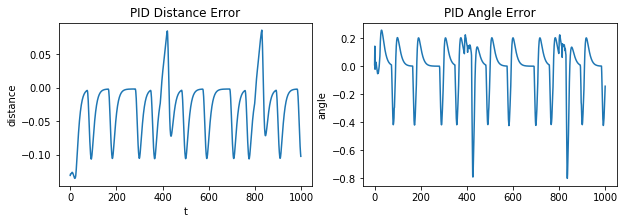

In [4]:
# Plot error

'''Plot distribution'''
plt.figure(figsize = (10,3))

plt.subplot(121)
plt.plot(error_dist)
plt.xlabel('t')
plt.ylabel('distance')
plt.title('PID Distance Error')

plt.subplot(122)
plt.plot(error_angle)
plt.ylabel('angle')
plt.title('PID Angle Error')

plt.show()

## Part 2: Pure Pursuit

Within **03-control.txt**, answer the following question:

*While robust, general, and simple, PID controllers also have limitations. What are some failure cases of PID controllers?*
 
In this section, we'll be looking into a type of controller known as a *Pure Pursuit* (PP) controller. A PP controller is not explicitly a reactive controller, but actually requires a reference trajectory that the controller follows. When we input the pose, velocity, and current waypoint, the controller outputs control commands that are used to steer the robot.

Besides robot-specific parameters (which need to be set only once), a PP controller has a single, tunable parameter: *look-ahead* distance. The look-ahead distance is how far along the current path (more on how we do this next section) the robot should _look ahead_ from to compute the angular velocity commands. For simplicity, in our example, the velocity will be fixed.

Before we move on to the code, write the answer to the following in **03-control.txt**:

*Recall the lecture notes about PP controllers. How does the look-ahead distance affect performance? What does a small look-ahead distance prioritize? What about a larger one?*

*** 

As we start the last practical portion of the exercise, we recall a requirement of the PP controller: a reference trajectory. How can we get this from the simulator?

The answer lies inside of the `simulator.py` code, available [here](https://github.com/duckietown/gym-duckietown/blob/master/gym_duckietown/simulator.py). In `gym-duckietown`, we load every tile with a *Bezier* curve, which allows us to calculate a *reward* (useful in reinforcement learning, which we will see later). Each Bezier curve was designed to perfectly fit the right lane of each tile.

`gym-duckietown` provides a few helper functions that we will make use of. Inside of `controller.py:Controller:pure_pursuit`, you will notice a call to `closest_curve_point`, which returns the closest point on the reference trajectory. 

While we have a boilerplate function written, it still needs work. In particular, the main things that need your attention are:

- `follow_point` needs to be a function of a few more items, not just the closest point.
- Once you have the correct waypoint, you need to calculate the $\omega$ that gets you there. You can also change $v$ to go as fast as possible.


In [2]:
from notebooks.code.exercise_03_control.controller import Controller

# Reset environment
local_env = launch_env()
local_env = SteeringToWheelVelWrapper(wrap_env(local_env))
local_env.reset()
local_env.robot_speed = 0.5
controller = Controller()
total_reward = 0             
    
# Starting to drive
for _ in range(1000):
   
    # Getting the global pose
    pos = local_env.cur_pos
    angle = local_env.cur_angle
    
    # Control
    v, omega = controller.pure_pursuit(local_env, pos, angle)
    commands = np.array([v, omega])
    
    # Step
    _, r, d, _ = local_env.step(commands)
    total_reward += r
    
    if d: 
        print("Duckiebot crashed.")
        break
        
local_env.close()

08:48:55|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
08:48:55|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
08:48:55|gym-duckietown|simulator.py:535|_load_map(): loading map file "/duckietown/simulation/gym_duckietown/maps/loop_empty.yaml"
08:48:55|gym-duckietown|objmesh.py:50|__init__(): loading mesh "duckiebot.obj"
08:48:55|gym-duckietown|objmesh.py:238|_load_mtl(): loading materials from "/duckietown/simulation/gym_duckietown/meshes/duckiebot.mtl"
08:48:56|gym-duckietown|objmesh.py:50|__init__(): loading mesh "duckie.obj"
08:48:56|gym-duckietown|graphics.py:60|load_texture(): loading texture "duckie.png"
08:48:56|gym-duckietown|objmesh.py:50|__init__(): loading mesh "cone.obj"
08:48:56|gym-duckietown|graphics.py:60|load_texture(): loading texture "cone.png"
08:48:56|gym-duckietown|graphics.py:60|load_texture(): loading texture "floor_1.png"
08:48:56|gym-duckietown|graphics

08:48:56|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
08:48:56|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
08:48:56|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.59826268 0.         2.08721855]
08:48:56|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.5894849  0.         2.18432262]
08:48:56|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.60704045 0.         1.99011448]
08:48:56|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.48173779 0.         2.07668522]
08:48:56|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.48172154 0.         1.84866924] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f24b9875828>, 'color': array([1, 1, 1])}
08:48:56|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

08:48:56|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [4.02468139 0.         1.75868687]
08:48:56|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.49620504 0.         2.20742184] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f24b9875828>, 'color': array([1, 1, 1])}
08:48:56|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
08:48:56|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
08:48:56|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.57500004 0.         2.14999713]
08:48:56|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.49620504 0.         2.20742184]
08:48:56|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.65379505 0.         2.09257242]
08:48:56|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.50609039 0.         2.05

08:49:00|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
08:49:00|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
08:49:00|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [2.33703727 0.         2.57700384]
08:49:00|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [2.24568806 0.         2.542922  ]
08:49:00|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [2.42838647 0.         2.61108568]
08:49:00|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [2.37793548 0.         2.46738479]
08:49:00|gym-duckietown|simulator.py:1092|_drivable_pos(): [2.28873639 0.         2.68406941] corresponds to tile at (3, 4) which is not drivable: {'coords': (3, 4), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f24b9875828>, 'color': array([1, 1, 1])}
08:49:00|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

08:49:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.2618872  0.         3.03303575] angle 2.955220849104552
08:49:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.23902905 0.         3.02855315] angle 2.940669475084639
08:49:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.23902905 0.         3.02855315] angle 2.940669475084639
08:49:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.21623946 0.         3.02373418] angle 2.9257451657545976
08:49:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.21623946 0.         3.02373418] angle 2.9257451657545976
08:49:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.19352433 0.         3.0185756 ] angle 2.910817917363188
08:49:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.19352433 0.         3.0185756 ] angle 2.910817917363188
08:49:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.1708923  0.         3.01306402] angle 2.89460687042862
08:49:01|gym-duckietown|simulat

Duckiebot crashed.


To see qualitatively how you are doing:

In [3]:
print("Your score: {}".format(total_reward))
view_results_ipython(local_env)

Your score: -1002.2830652948776


For this portion of the exercise, submit one plot with **cross-track error**, **angle error**, **commanded linear velocity** and **commanded angular velocity** vs. time. Lastly, experiment with the `lookup_distance` hyperparameter; does the lowering / raising this value match your hypothesis from earlier in this exercise?

Please submit the plot, `controller.py`, and `control.txt` inside of the zip file, and upload it to the Software submission link posted on Piazza.